In [1]:
%matplotlib inline

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from PIL import Image
from torch.utils.data.sampler import WeightedRandomSampler
from torchvision.datasets import DatasetFolder
import torchvision
from tqdm.notebook import tqdm as tqdm
from torchsampler import ImbalancedDatasetSampler
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import confusion_matrix
from torch.utils.data.sampler import SubsetRandomSampler
import torch.nn.functional as F
import copy
import os
from torchsummary import summary
from sklearn.metrics import f1_score

In [2]:
train_on_gpu = torch.cuda.is_available()
if not train_on_gpu:
    print('CUDA is not available.')
else:
    print('CUDA is available!')
device = "cuda" if train_on_gpu else "cpu"
# device = 'cpu'
RESUME = True

CUDA is available!


In [3]:
# supervised_path = "/home/max/Desktop/galaxy_science_display/eight_type/train/"
# val_image_path = "/home/max/Desktop/galaxy_science_display/galaxy_image/eight_type/validation/"
# test_image_path = "/home/max/Desktop/galaxy_science_display/galaxy_image/eight_type/test/"
unsupervised_path = "/home/max/Desktop/galaxy_science_display/images_gz2/"
iter1_supervised_path = "/home/max/Desktop/eight_type/train/"
# supervised_path = "/home/max/Desktop/galaxy_science_display/eight_type/train/"
supervised_path = "/home/max/Desktop/galaxy_science_display/galaxy_image/eight_type/train"
val_image_path = "/home/max/Desktop/galaxy_science_display/eight_type/validation/"
test_image_path = "/home/max/Desktop/galaxy_science_display/eight_type/test/"


batch_size = 24
train_trans = transforms.Compose([
#                                   transforms.RandomHorizontalFlip(),
#                                   transforms.RandomRotation((-30, 30)),
#                                   transforms.Resize((256, 256)),
#                                   transforms.RandomCrop(size=(100, 100)),
                                  transforms.Resize((256, 256)),
#                                   transforms.CenterCrop(200),
#                                   transforms.Resize((256, 256)),
#                                   transforms.Resize((255, 255)),
#                                   transforms.GaussianBlur(7,3),
#                                   transforms.ColorJitter(contrast=0.8),
                                  transforms.ToTensor()])
train_data = ImageFolder(supervised_path, transform=train_trans)
train_loader = DataLoader(train_data, pin_memory=True, batch_size=batch_size, sampler=ImbalancedDatasetSampler(train_data))

val_trans = transforms.Compose([transforms.Resize((256, 256)),transforms.ToTensor()])
val_data = ImageFolder(val_image_path, transform = val_trans)
val_loader = DataLoader(val_data, shuffle = True)

test_trans = transforms.Compose([transforms.Resize((256, 256)),transforms.ToTensor()])
test_data = ImageFolder(test_image_path, transform = test_trans)
test_loader = DataLoader(test_data, shuffle = True)

unsuper_trans = transforms.Compose([
#                                   transforms.RandomHorizontalFlip(),
#                                   transforms.RandomRotation((-30, 30)),
                                  transforms.Resize((256, 256)),
#                                   transforms.RandomCrop(size=(200, 200)),
#                                   transforms.Resize((256, 256)),
#                                   transforms.CenterCrop(200),
#                                   transforms.Resize((256, 256)),
#                                   transforms.GaussianBlur(7,3),
#                                   transforms.ColorJitter(contrast=0.8),
#                                   transforms.RandomResizedCrop((224, 224)),
                                  transforms.ToTensor()])
unsuper_data = ImageFolder(unsupervised_path, transform=unsuper_trans)
unsuper_loader = DataLoader(unsuper_data, pin_memory=True, batch_size=batch_size, shuffle=True)

tensor([6, 2, 5, 0, 4, 3, 4, 7, 1, 0, 0, 4, 3, 2, 0, 0, 7, 4, 4, 6, 3, 6, 5, 6])
tensor(6)


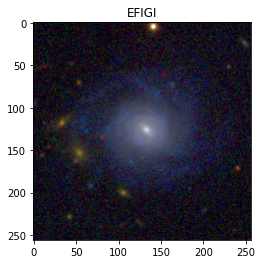

tensor(2)


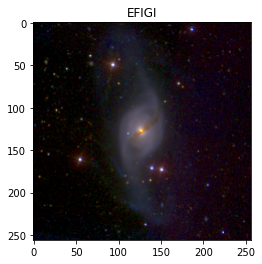

tensor(5)


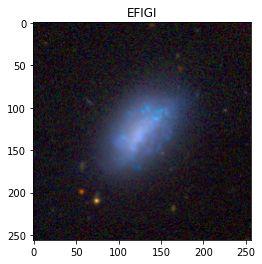

tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])
tensor(0)


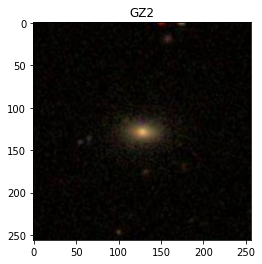

tensor(0)


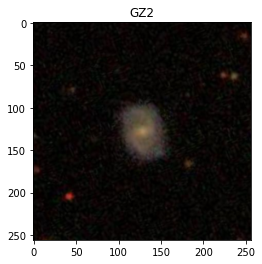

tensor(0)


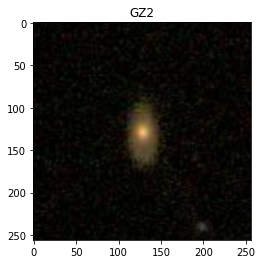

In [4]:
images, labels = next(iter(train_loader))
print(labels)
for i in np.arange(3):
    print(labels[i])
    plt.figure(i)
    plt.title('EFIGI')
    plt.imshow(images[i].permute(1, 2, 0))
    plt.show()
    
un_images, un_labels = next(iter(unsuper_loader))
print(un_labels)
for i in np.arange(3):
    print(un_labels[i])
    plt.figure(i)
    plt.title('GZ2')
    plt.imshow(un_images[i].permute(1, 2, 0))
    plt.show()

In [5]:
# model = torchvision.models.resnet18(pretrained=False)
model = torchvision.models.inception_v3(pretrained=True)
model = model.to(device)

In [6]:
optimizer = torch.optim.Adam(model.parameters(), lr=3e-4)
# optimizer = torch.optim.SGD(filter(lambda p: p.requires_grad, finetune_model.parameters()), lr=0.00001)
loss_func = nn.CrossEntropyLoss()

In [7]:
# # reg = JacobianReg() # Jacobian regularization
# lambda_JR = 0.01 # hyperparameter
# l1_crit = nn.L1Loss(size_average=False)
# factor = 0.03
n_epochs = 50
train_loss_record = []
train_acc_record = []
val_loss_record = []
val_acc_record = []
min_loss = 2000.
for epoch in range(n_epochs):
    train_loss = 0.0
    val_loss = 0.0
    train_acc = 0.0
    val_acc = 0.0
    model.train()
    for x, y in tqdm(train_loader):
        x, y = x.to(device), y.to(device)
        optimizer.zero_grad()
        prediction = model(x)
#         reg_loss = 0
#         reg_loss = l1_crit(prediction.argmax(dim = 1), y)
        
        loss = loss_func(prediction, y)
        
#         loss = super_loss + factor*reg_loss
        
        loss.backward()
        optimizer.step()
        
        acc = ((prediction.argmax(dim = 1) == y).float().mean())
        train_acc += acc/len(train_loader)
        train_loss += loss/len(train_loader)
    print(f"[ Train | {epoch+1}/{n_epochs} ] loss = {train_loss:.5f}, acc = {train_acc:.5f}")
    train_loss_record.append(train_loss.item())
    train_acc_record.append(train_acc.item())

    model.eval()
    for x, y in tqdm(val_loader):
        with torch.no_grad():
            x, y = x.to(device), y.to(device)
            prediction = model(x)
#             reg_loss = 0

#             reg_loss = l1_crit(prediction.argmax(dim = 1), y)

            loss = loss_func(prediction, y)

#             loss = super_loss + factor*reg_loss

    #         loss.backward()
            acc = ((prediction.argmax(dim = 1) == y).float().mean())
            val_acc += acc/len(val_loader)
            val_loss += loss/len(val_loader)
    if val_loss < min_loss:
        min_loss = val_loss
        torch.save(model, "resnet.pkl")
        print("Model Saved")
#             torch.save(state, "./checkpoint/best_%s.pth" % (str(epoch)))
#             torch.save(finetune_model, 'E_I_S_new.pkl')
    print(f"[ Validation | {epoch+1}/{n_epochs} ] loss = {val_loss:.5f}, acc = {val_acc:.5f}")
    val_loss_record.append(val_loss.item())
    val_acc_record.append(val_acc.item())
# torch.save(model, 'E_I_Sc.pkl')

  0%|          | 0/81 [00:00<?, ?it/s]

/home/max/.local/lib/python3.8/site-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


[ Train | 1/50 ] loss = 2.25641, acc = 0.30710


  0%|          | 0/145 [00:00<?, ?it/s]

Model Saved
[ Validation | 1/50 ] loss = 1.76390, acc = 0.26897


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 2/50 ] loss = 1.47528, acc = 0.39095


  0%|          | 0/145 [00:00<?, ?it/s]

Model Saved
[ Validation | 2/50 ] loss = 1.58151, acc = 0.37931


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 3/50 ] loss = 1.39628, acc = 0.43930


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 3/50 ] loss = 1.86923, acc = 0.31034


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 4/50 ] loss = 1.27310, acc = 0.48354


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 4/50 ] loss = 2.04635, acc = 0.26207


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 5/50 ] loss = 1.03194, acc = 0.59979


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 5/50 ] loss = 1.85909, acc = 0.31724


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 6/50 ] loss = 0.80822, acc = 0.69856


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 6/50 ] loss = 3.36139, acc = 0.29655


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 7/50 ] loss = 0.51700, acc = 0.81739


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 7/50 ] loss = 2.17580, acc = 0.43448


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 8/50 ] loss = 0.42763, acc = 0.85854


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 8/50 ] loss = 2.55678, acc = 0.34483


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 9/50 ] loss = 0.36105, acc = 0.87706


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 9/50 ] loss = 1.90124, acc = 0.42069


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 10/50 ] loss = 0.27351, acc = 0.90432


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 10/50 ] loss = 1.96683, acc = 0.43448


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 11/50 ] loss = 0.21876, acc = 0.93261


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 11/50 ] loss = 1.85107, acc = 0.44828


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 12/50 ] loss = 0.12634, acc = 0.96399


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 12/50 ] loss = 2.12556, acc = 0.49655


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 13/50 ] loss = 0.12172, acc = 0.96554


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 13/50 ] loss = 2.09561, acc = 0.45517


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 14/50 ] loss = 0.06839, acc = 0.97891


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 14/50 ] loss = 2.45077, acc = 0.46897


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 15/50 ] loss = 0.06810, acc = 0.98251


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 15/50 ] loss = 2.30535, acc = 0.48276


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 16/50 ] loss = 0.18670, acc = 0.94342


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 16/50 ] loss = 2.24926, acc = 0.41379


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 17/50 ] loss = 0.18733, acc = 0.93570


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 17/50 ] loss = 2.68904, acc = 0.37931


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 18/50 ] loss = 0.11034, acc = 0.96605


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 18/50 ] loss = 2.30759, acc = 0.46897


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 19/50 ] loss = 0.09559, acc = 0.97171


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 19/50 ] loss = 2.56658, acc = 0.48276


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 20/50 ] loss = 0.07663, acc = 0.97685


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 20/50 ] loss = 2.69489, acc = 0.43448


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 21/50 ] loss = 0.05117, acc = 0.98405


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 21/50 ] loss = 2.97370, acc = 0.43448


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 22/50 ] loss = 0.13647, acc = 0.94959


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 22/50 ] loss = 2.56645, acc = 0.46207


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 23/50 ] loss = 0.05509, acc = 0.98611


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 23/50 ] loss = 2.41674, acc = 0.46207


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 24/50 ] loss = 0.05062, acc = 0.98405


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 24/50 ] loss = 2.74795, acc = 0.48966


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 25/50 ] loss = 0.08431, acc = 0.97428


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 25/50 ] loss = 2.37834, acc = 0.48276


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 26/50 ] loss = 0.06890, acc = 0.98045


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 26/50 ] loss = 3.20847, acc = 0.42069


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 27/50 ] loss = 0.08709, acc = 0.97274


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 27/50 ] loss = 2.75192, acc = 0.44828


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 28/50 ] loss = 0.08104, acc = 0.96914


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 28/50 ] loss = 2.57366, acc = 0.45517


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 29/50 ] loss = 0.07609, acc = 0.97737


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 29/50 ] loss = 2.73984, acc = 0.42759


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 30/50 ] loss = 0.04958, acc = 0.98663


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 30/50 ] loss = 2.57703, acc = 0.46897


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 31/50 ] loss = 0.03665, acc = 0.98817


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 31/50 ] loss = 2.78225, acc = 0.48276


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 32/50 ] loss = 0.06391, acc = 0.98457


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 32/50 ] loss = 2.95801, acc = 0.40000


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 33/50 ] loss = 0.04840, acc = 0.98611


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 33/50 ] loss = 2.45756, acc = 0.47586


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 34/50 ] loss = 0.05199, acc = 0.98405


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 34/50 ] loss = 3.22582, acc = 0.43448


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 35/50 ] loss = 0.12919, acc = 0.95267


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 35/50 ] loss = 2.70908, acc = 0.48276


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 36/50 ] loss = 0.07476, acc = 0.97325


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 36/50 ] loss = 2.91684, acc = 0.44828


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 37/50 ] loss = 0.09460, acc = 0.97531


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 37/50 ] loss = 2.89898, acc = 0.44828


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 38/50 ] loss = 0.03229, acc = 0.99074


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 38/50 ] loss = 2.76418, acc = 0.47586


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 39/50 ] loss = 0.06299, acc = 0.98251


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 39/50 ] loss = 2.79100, acc = 0.43448


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 40/50 ] loss = 0.16414, acc = 0.93981


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 40/50 ] loss = 2.61443, acc = 0.41379


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 41/50 ] loss = 0.05909, acc = 0.98302


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 41/50 ] loss = 2.60025, acc = 0.44828


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 42/50 ] loss = 0.05516, acc = 0.98817


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 42/50 ] loss = 2.75152, acc = 0.45517


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 43/50 ] loss = 0.06333, acc = 0.98148


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 43/50 ] loss = 2.65445, acc = 0.48276


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 44/50 ] loss = 0.02824, acc = 0.99537


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 44/50 ] loss = 2.93008, acc = 0.44138


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 45/50 ] loss = 0.01901, acc = 0.99434


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 45/50 ] loss = 2.73060, acc = 0.47586


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 46/50 ] loss = 0.01396, acc = 0.99794


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 46/50 ] loss = 2.96966, acc = 0.43448


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 47/50 ] loss = 0.00696, acc = 0.99897


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 47/50 ] loss = 3.03021, acc = 0.43448


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 48/50 ] loss = 0.00461, acc = 0.99949


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 48/50 ] loss = 3.00424, acc = 0.44828


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 49/50 ] loss = 0.00382, acc = 0.99949


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 49/50 ] loss = 3.19296, acc = 0.41379


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 50/50 ] loss = 0.00392, acc = 0.99949


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 50/50 ] loss = 3.23952, acc = 0.41379


In [8]:
# finetune_model = torch.load('/home/max/Desktop/galaxy_final/finetune_model_new_version_iter1.pkl')
# finetune_model = torch.load('E_I_S_new_1227.pkl')
actu = []
ai_pred = []
model.eval()
test_acc = 0.0
test_loss = 0.0
for x, y in tqdm(test_loader):
    with torch.no_grad():
        x, y = x.to(device), y.to(device)
        prediction = model(x)
        actu.append(y.to('cpu').numpy()[0])
        ai_pred.append(prediction.argmax().to('cpu').numpy().tolist())
        loss = loss_func(prediction, y)
    #     loss.backward()
        acc = ((prediction.argmax(dim = 1) == y).float().mean())
        test_acc += acc/len(test_loader)
        test_loss += loss/len(test_loader)
print(f"[ Test ] loss = {test_loss:.5f}, acc = {test_acc:.5f}")

  0%|          | 0/145 [00:00<?, ?it/s]

[ Test ] loss = 4.06164, acc = 0.25517


tensor([1.0224], device='cuda:0', grad_fn=<IndexBackward>)
1.0224485397338867


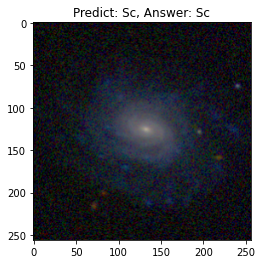

tensor([1.8358], device='cuda:0', grad_fn=<IndexBackward>)
1.8358137607574463


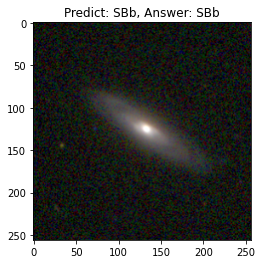

tensor([1.9436], device='cuda:0', grad_fn=<IndexBackward>)
1.9436066150665283


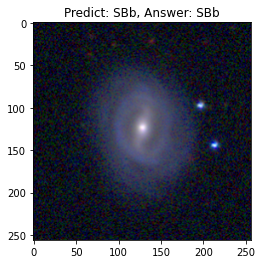

tensor([0.9892], device='cuda:0', grad_fn=<IndexBackward>)
0.9891760945320129


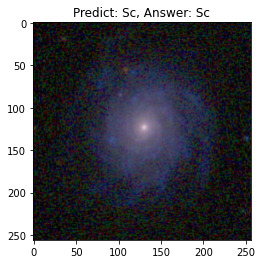

tensor([1.1430], device='cuda:0', grad_fn=<IndexBackward>)
1.1430455446243286


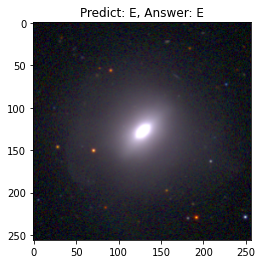

tensor([1.2782], device='cuda:0', grad_fn=<IndexBackward>)
1.2781908512115479


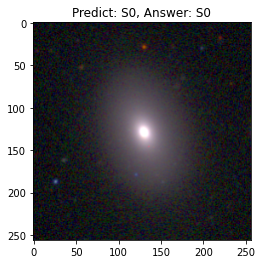

tensor([0.6963], device='cuda:0', grad_fn=<IndexBackward>)
0.6962523460388184


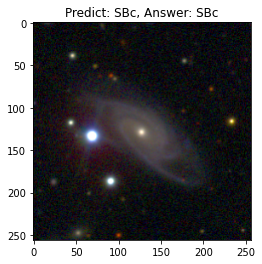

tensor([1.7717], device='cuda:0', grad_fn=<IndexBackward>)
1.771715521812439


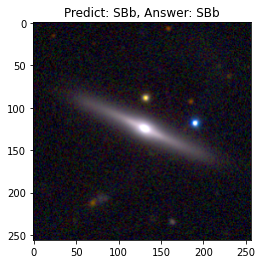

tensor([1.7740], device='cuda:0', grad_fn=<IndexBackward>)
1.774025321006775


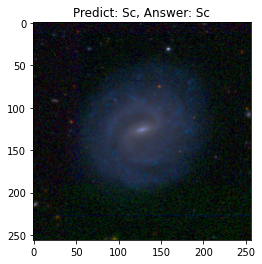

tensor([1.3957], device='cuda:0', grad_fn=<IndexBackward>)
1.3957148790359497


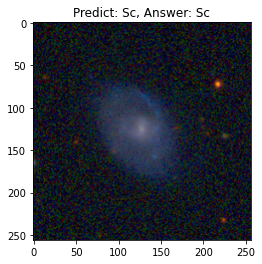

tensor([2.0233], device='cuda:0', grad_fn=<IndexBackward>)
2.0232861042022705


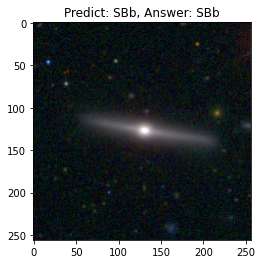

tensor([1.7783], device='cuda:0', grad_fn=<IndexBackward>)
1.7783024311065674


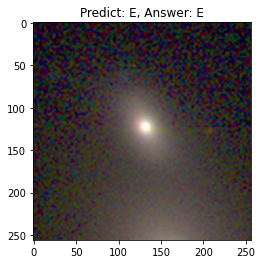

tensor([0.6971], device='cuda:0', grad_fn=<IndexBackward>)
0.6970700621604919


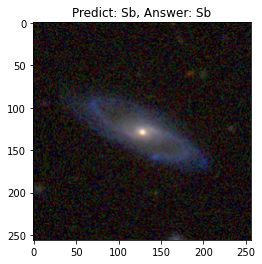

tensor([0.9541], device='cuda:0', grad_fn=<IndexBackward>)
0.9540800452232361


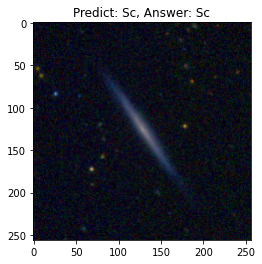

tensor([1.3476], device='cuda:0', grad_fn=<IndexBackward>)
1.3476165533065796


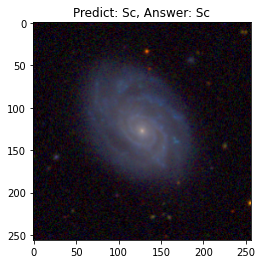

tensor([1.3866], device='cuda:0', grad_fn=<IndexBackward>)
1.3865715265274048


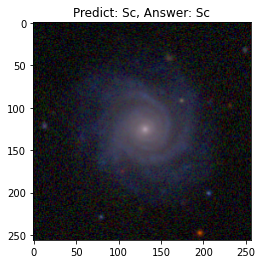

tensor([1.0049], device='cuda:0', grad_fn=<IndexBackward>)
1.0048960447311401


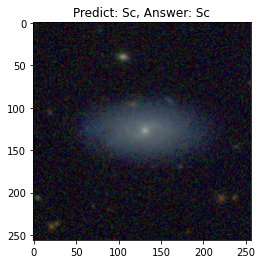

tensor([1.7762], device='cuda:0', grad_fn=<IndexBackward>)
1.7762364149093628


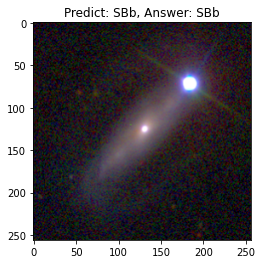

tensor([0.9174], device='cuda:0', grad_fn=<IndexBackward>)
0.9173911213874817


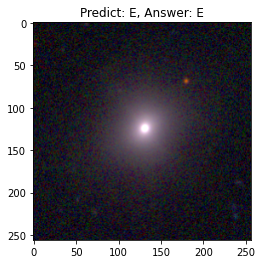

tensor([2.3081], device='cuda:0', grad_fn=<IndexBackward>)
2.3081090450286865


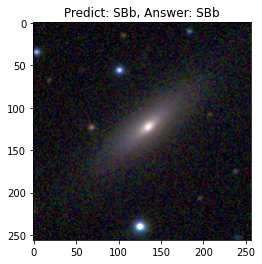

tensor([1.5595], device='cuda:0', grad_fn=<IndexBackward>)
1.559491515159607


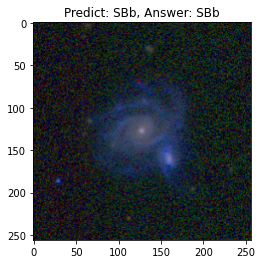

tensor([1.1249], device='cuda:0', grad_fn=<IndexBackward>)
1.1248997449874878


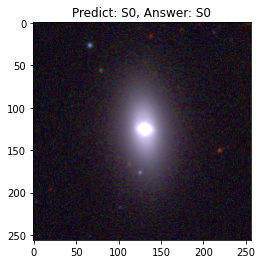

tensor([1.1293], device='cuda:0', grad_fn=<IndexBackward>)
1.1292506456375122


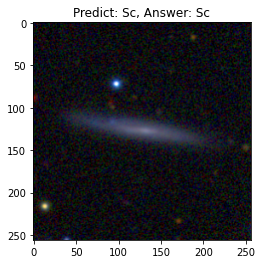

tensor([2.5948], device='cuda:0', grad_fn=<IndexBackward>)
2.594764471054077


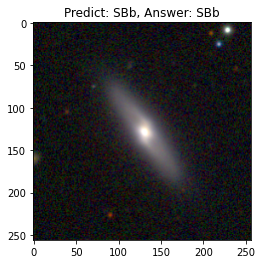

tensor([1.4230], device='cuda:0', grad_fn=<IndexBackward>)
1.422977328300476


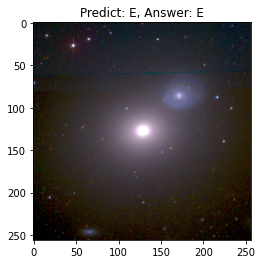

tensor([0.5780], device='cuda:0', grad_fn=<IndexBackward>)
0.5779651999473572


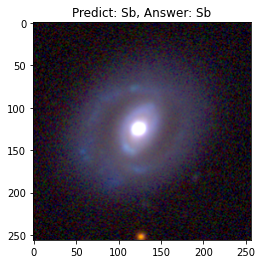

tensor([1.6659], device='cuda:0', grad_fn=<IndexBackward>)
1.6659281253814697


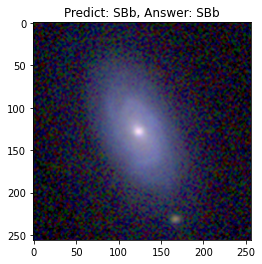

tensor([1.0515], device='cuda:0', grad_fn=<IndexBackward>)
1.0515016317367554


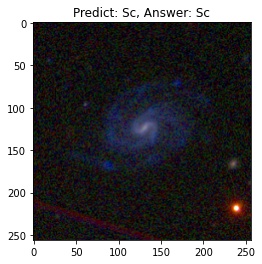

tensor([1.8041], device='cuda:0', grad_fn=<IndexBackward>)
1.8040803670883179


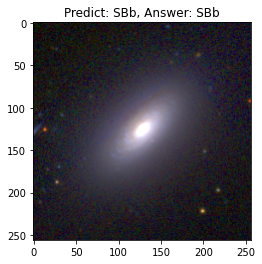

tensor([2.0558], device='cuda:0', grad_fn=<IndexBackward>)
2.0557870864868164


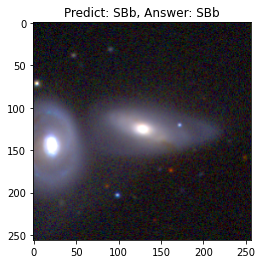

tensor([1.5579], device='cuda:0', grad_fn=<IndexBackward>)
1.5578540563583374


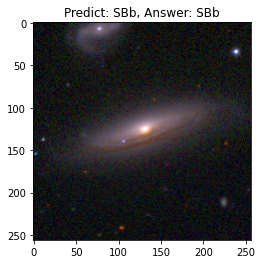

tensor([0.6188], device='cuda:0', grad_fn=<IndexBackward>)
0.6188451647758484


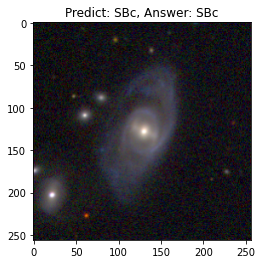

tensor([0.7472], device='cuda:0', grad_fn=<IndexBackward>)
0.7472121119499207


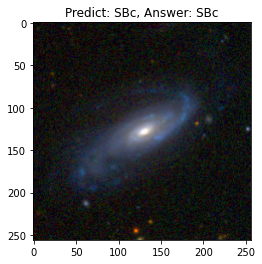

tensor([2.4701], device='cuda:0', grad_fn=<IndexBackward>)
2.4700968265533447


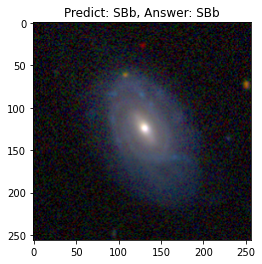

tensor([1.5959], device='cuda:0', grad_fn=<IndexBackward>)
1.595901608467102


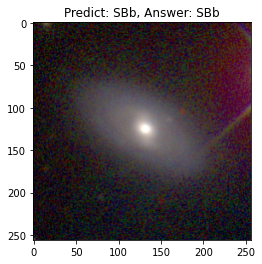

tensor([1.6703], device='cuda:0', grad_fn=<IndexBackward>)
1.6702736616134644


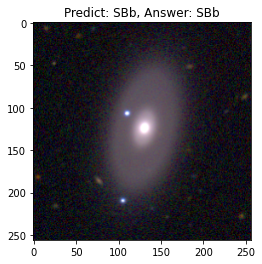

tensor([2.4093], device='cuda:0', grad_fn=<IndexBackward>)
2.409252405166626


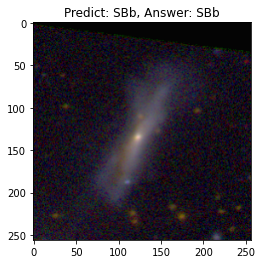

tensor([1.3037], device='cuda:0', grad_fn=<IndexBackward>)
1.3037241697311401


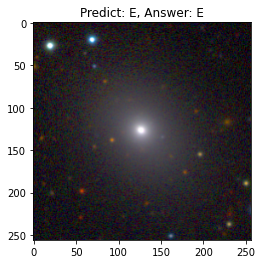

tensor([1.1322], device='cuda:0', grad_fn=<IndexBackward>)
1.1321967840194702


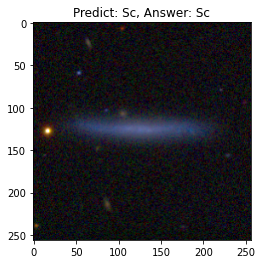

tensor([0.9590], device='cuda:0', grad_fn=<IndexBackward>)
0.9590184092521667


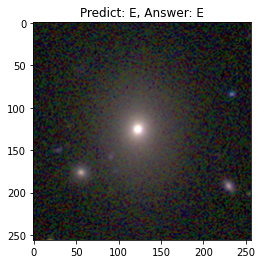

tensor([1.7651], device='cuda:0', grad_fn=<IndexBackward>)
1.7651299238204956


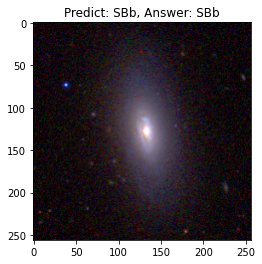

tensor([1.1236], device='cuda:0', grad_fn=<IndexBackward>)
1.1235955953598022


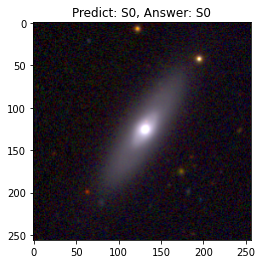

tensor([1.0694], device='cuda:0', grad_fn=<IndexBackward>)
1.0694031715393066


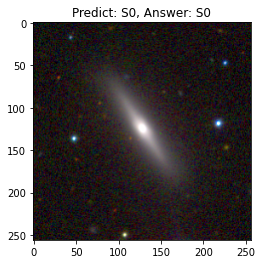

tensor([0.7735], device='cuda:0', grad_fn=<IndexBackward>)
0.7734649181365967


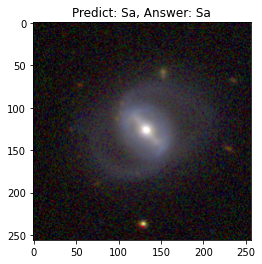

tensor([1.9580], device='cuda:0', grad_fn=<IndexBackward>)
1.9579740762710571


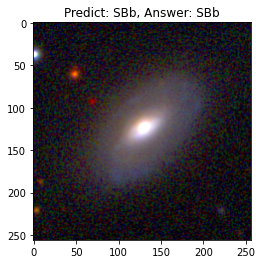

tensor([0.8612], device='cuda:0', grad_fn=<IndexBackward>)
0.8611781001091003


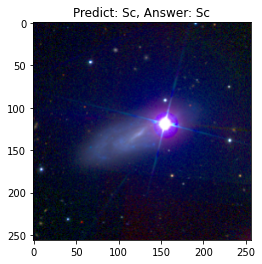

tensor([1.4658], device='cuda:0', grad_fn=<IndexBackward>)
1.4657543897628784


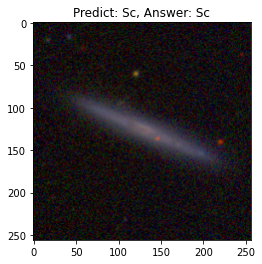

tensor([0.8756], device='cuda:0', grad_fn=<IndexBackward>)
0.8756179809570312


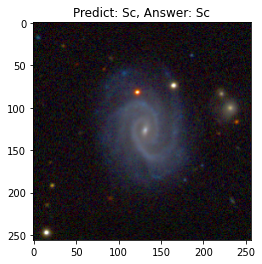

tensor([1.6754], device='cuda:0', grad_fn=<IndexBackward>)
1.6753730773925781


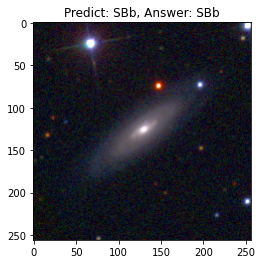

tensor([1.3265], device='cuda:0', grad_fn=<IndexBackward>)
1.3265122175216675


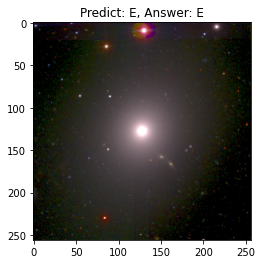

tensor([0.8403], device='cuda:0', grad_fn=<IndexBackward>)
0.8402743339538574


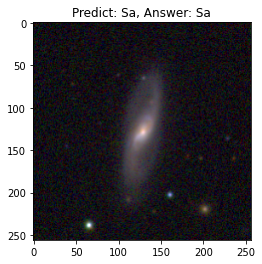

tensor([1.3752], device='cuda:0', grad_fn=<IndexBackward>)
1.3751742839813232


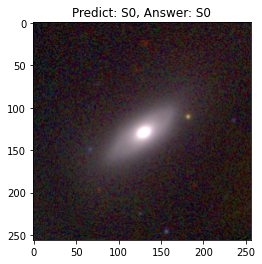

tensor([1.4127], device='cuda:0', grad_fn=<IndexBackward>)
1.4126853942871094


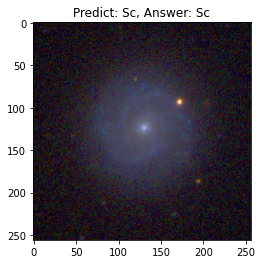

tensor([1.3712], device='cuda:0', grad_fn=<IndexBackward>)
1.3712013959884644


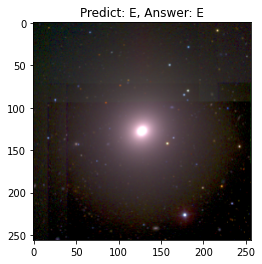

tensor([1.9509], device='cuda:0', grad_fn=<IndexBackward>)
1.9509285688400269


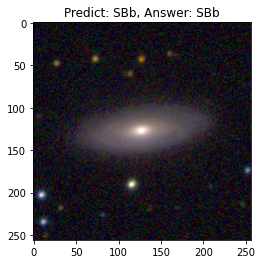

tensor([1.2941], device='cuda:0', grad_fn=<IndexBackward>)
1.294071912765503


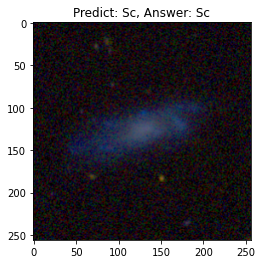

tensor([1.1721], device='cuda:0', grad_fn=<IndexBackward>)
1.1720942258834839


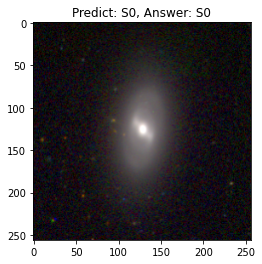

tensor([0.9632], device='cuda:0', grad_fn=<IndexBackward>)
0.9631780982017517


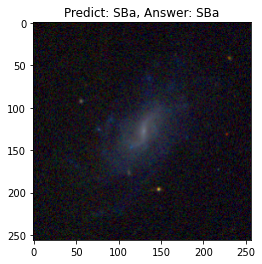

tensor([0.8951], device='cuda:0', grad_fn=<IndexBackward>)
0.8951128125190735


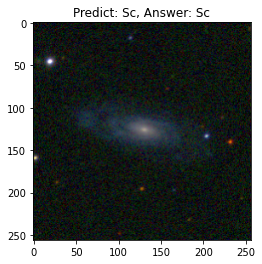

tensor([1.0360], device='cuda:0', grad_fn=<IndexBackward>)
1.0359714031219482


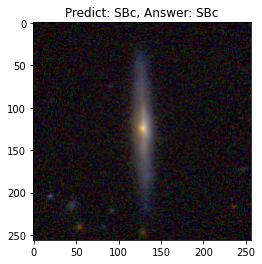

In [9]:
# model = torch.load('/home/max/Desktop/galaxy_final/finetune_model_new_version_iter1.pkl')
galaxy_type = ['E', 'S0', 'Sa', 'Sb', 'SBa', 'SBb', 'SBc', 'Sc']
loss_func = nn.CrossEntropyLoss()
i = 0
data = []
_all = []
for x, y in val_loader:
    i += 1
    if train_on_gpu:
        x, y = x.cuda(), y.cuda()
    output = model(x)/10
#     print(output)
#     break
    out = output.argmax(dim = 1)
#     out = out.to('cpu').numpy()
    ans = galaxy_type[y[0]]
    pre = galaxy_type[out[0]]
    if ans == pre:
        print(output[0][out])
    if output[0][out] > 0.3 and ans == pre:
        data.append(output[0][out].item())
        print(output[0][out].item())
        plt.figure(i)
        plt.title(f'Predict: {pre}, Answer: {ans}')
#         if out[0] == 0:

#         elif out[0] == 1:
#             plt.title(f'Predict: {pre}, Answer: {ans}')
#         else:
#             plt.title(f'Predict: S, Answer: {ans}')
        x = x.squeeze()
        x = x.to('cpu')
        plt.imshow(x.permute(1, 2, 0))
        plt.show()
    else:
        _all.append(output[0][out].item())
        
#     if i % 10 == 0:
        
#         plt.figure(i)
#         plt.title(f'Predict: {pre}, Answer: {ans}')
# #         if out[0] == 0:
            
# #         elif out[0] == 1:
# #             plt.title(f'Predict: {pre}, Answer: {ans}')
# #         else:
# #             plt.title(f'Predict: S, Answer: {ans}')
#         x = x.squeeze()
#         x = x.to('cpu')
# #         plt.imshow(x.permute(1, 2, 0))
# #         plt.show()

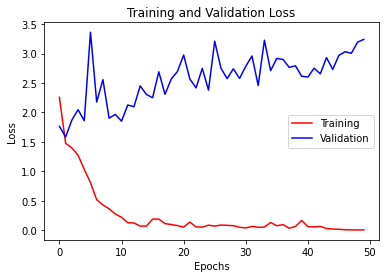

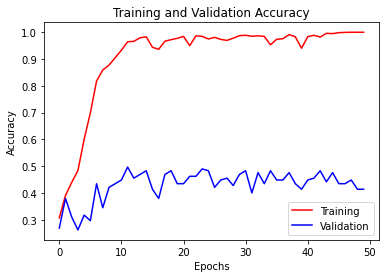

In [10]:
plt.figure(1)
plt.title('Training and Validation Loss')
train_l, = plt.plot(train_loss_record, color = 'red')
val_l, = plt.plot(val_loss_record, color = 'blue')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(handles = [train_l, val_l], labels = ['Training', 'Validation'], loc = 'best')
plt.show()

plt.figure(2)
plt.title('Training and Validation Accuracy')
train_a, = plt.plot(train_acc_record, color = 'red')
val_a, = plt.plot(val_acc_record, color = 'blue')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend(handles = [train_a, val_a], labels = ['Training', 'Validation'], loc = 'best')
plt.show()

In [11]:
confmat = confusion_matrix(y_true=actu, y_pred=ai_pred)

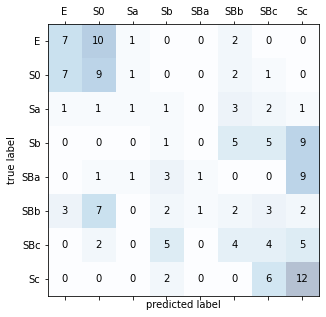

In [12]:
fig, ax = plt.subplots(figsize=(5, 5))
ax.matshow(confmat, cmap=plt.cm.Blues, alpha=0.3)
for i in range(confmat.shape[0]):
    for j in range(confmat.shape[1]):
        ax.text(x=j, y=i, s=confmat[i,j], va='center', ha='center')
plt.xlabel('predicted label')
plt.ylabel('true label')
plt.xticks([0, 1, 2, 3, 4, 5, 6, 7],['E', 'S0', 'Sa', 'Sb', 'SBa', 'SBb', 'SBc', 'Sc'])
plt.yticks([0, 1, 2, 3, 4, 5, 6, 7],['E', 'S0', 'Sa', 'Sb', 'SBa', 'SBb', 'SBc', 'Sc'])
plt.show()

In [13]:
f1score = f1_score(actu, ai_pred, average='weighted')
print(f1score)

0.22911540140028783
